<a href="https://colab.research.google.com/github/wira29/2141720184_machine-learning_2023/blob/main/UTS/uts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
import numpy as np

In [ ]:
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


####load 5 gambar plat nomor

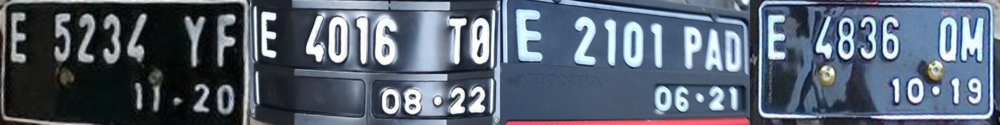

In [ ]:
img1 = cv.resize(cv.imread("/content/drive/MyDrive/PCVK/uts_ml/1.jpg"), (600, 300))
img2 = cv.resize(cv.imread("/content/drive/MyDrive/PCVK/uts_ml/2.jpg"), (600, 300))
img3 = cv.resize(cv.imread("/content/drive/MyDrive/PCVK/uts_ml/3.jpg"), (600, 300))
img4 = cv.resize(cv.imread("/content/drive/MyDrive/PCVK/uts_ml/4.jpg"), (600, 300))

final_frame = np.hstack((img1, img2, img3, img4))

cv2_imshow(final_frame)

#### resolusi

In [ ]:
def resolution(img, skala):

  # Tingkatkan resolusi gambar dengan metode interpolasi
  result = cv.resize(img, None, fx=skala, fy=skala, interpolation=cv.INTER_CUBIC)
  return result


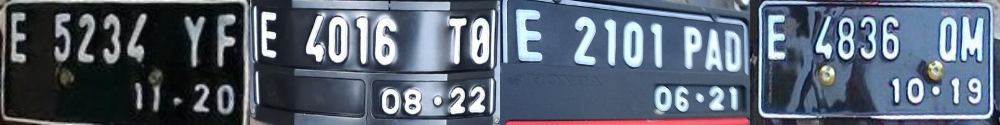

In [ ]:
resolution_img1 = resolution(img1, 2)
resolution_img2 = resolution(img2, 2)
resolution_img3 = resolution(img3, 2)
resolution_img4 = resolution(img4, 2)

final_frame = np.hstack((resolution_img1, resolution_img2, resolution_img3, resolution_img4))

cv2_imshow(final_frame)

#### brightness

In [ ]:
def brightness(img, n):
  brightness_image = np.zeros(img.shape, img.dtype)

  for y in range(img.shape[0]):
    for x in range(img.shape[1]):
      for c in range(img.shape[2]):
        brightness_image[y, x, c] = np.clip(img[y,x,c] + n, 0, 255)
  return brightness_image

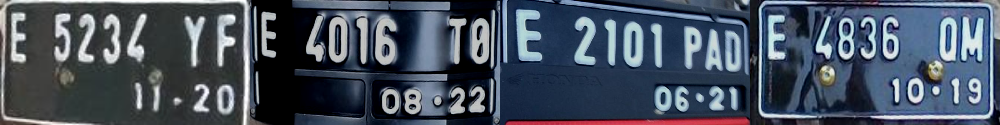

In [ ]:
brightness_img1 = brightness(resolution_img1, 40)
brightness_img2 = brightness(resolution_img2, -60)
brightness_img3 = brightness(resolution_img3, -40)
brightness_img4 = brightness(resolution_img4, -20)

final_frame = np.hstack((brightness_img1, brightness_img2, brightness_img3, brightness_img4))

cv2_imshow(final_frame)

####saturation

In [ ]:
def saturation(img, saturation_factor):
  result = cv.convertScaleAbs(img, alpha=1, beta=(1 - saturation_factor) * 255)
  return result

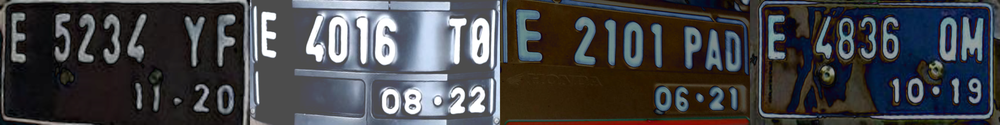

In [ ]:
saturated_img1 = saturation(brightness_img1, 1.3)
saturated_img2 = saturation(brightness_img2, 0.7)
saturated_img3 = saturation(brightness_img3, 1.3)
saturated_img4 = saturation(brightness_img4, 1.3)

final_frame = np.hstack((saturated_img1, saturated_img2, saturated_img3, saturated_img4))

cv2_imshow(final_frame)

#### filter gambar

In [ ]:
def gaussian(img, n_kernel = 5):

  # Terapkan filter Gaussian
  gambar_filtered = cv.GaussianBlur(img, (n_kernel, n_kernel), 0)

  return gambar_filtered


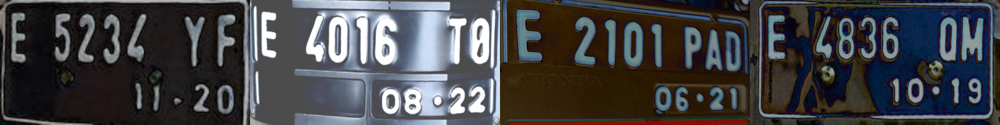

In [ ]:
filtered_img1 = gaussian(saturated_img1, 3)
filtered_img2 = gaussian(saturated_img2, 3)
filtered_img3 = gaussian(saturated_img3, 1)
filtered_img4 = gaussian(saturated_img4, 3)

final_frame = np.hstack((filtered_img1, filtered_img2, filtered_img3, filtered_img4))

cv2_imshow(final_frame)

# me2 = gaussian(me, 3)
# cv2_imshow(me2)

#### histogram equalization

In [ ]:
def equalization(img):
  R, G, B = cv.split(img)

  # Lakukan histogram equalization pada setiap saluran
  R_equalized = cv.equalizeHist(R)
  G_equalized = cv.equalizeHist(G)
  B_equalized = cv.equalizeHist(B)

  # Gabungkan kembali saluran-saluran yang sudah diubah
  gambar_equalized = cv.merge((R_equalized, G_equalized, B_equalized))
  return gambar_equalized

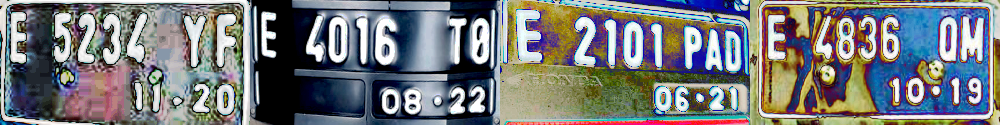

In [ ]:
equalized_img1 = equalization(filtered_img1)
equalized_img2 = equalization(filtered_img2)
equalized_img3 = equalization(filtered_img3)
equalized_img4 = equalization(filtered_img4)

final_frame = np.hstack((equalized_img1, equalized_img2, equalized_img3, equalized_img4))

cv2_imshow(final_frame)

# me7 = equalization(me2)
# cv2_imshow(me7)

In [ ]:
def colorCorrection(img):
  result = np.zeros(img.shape, img.dtype)

  for y in range(img.shape[0]):
    for x in range(img.shape[1]):
      for c in range(img.shape[2]):
        if(img[y, x, c] > 220):
          result[y, x, c] = img[y, x, c]
        else:
          result[y, x, c] = 0
  return result

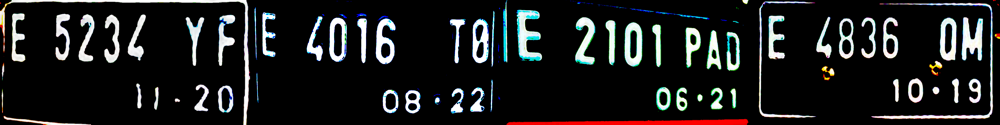

In [ ]:
correction_img1 = colorCorrection(equalized_img1)
correction_img2 = colorCorrection(equalized_img2)
correction_img3 = colorCorrection(equalized_img3)
correction_img4 = colorCorrection(equalized_img4)

final_frame = np.hstack((correction_img1, correction_img2, correction_img3, correction_img4))

cv2_imshow(final_frame)

#### KMeans

In [ ]:
from sklearn.cluster import KMeans

def kmeans(img):
  # Ubah gambar menjadi array satu dimensi
  pixel_values = img.reshape((-1, 3))

  # Tentukan jumlah cluster (dalam hal ini, 2 warna)
  jumlah_cluster = 2

  # Inisialisasi model K-Means
  kmeans = KMeans(n_clusters=jumlah_cluster)

  # Lakukan kmeans clustering
  kmeans.fit(pixel_values)

  # Dapatkan label cluster untuk setiap pixel
  labels = kmeans.labels_

  # Dapatkan titik tengah (warna rata-rata) dari masing-masing cluster
  colors = kmeans.cluster_centers_.astype(int)

  # Ubah img menjadi img hasil ekstraksi warna
  hasil_ekstraksi = colors[labels].reshape(img.shape)

  return hasil_ekstraksi

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


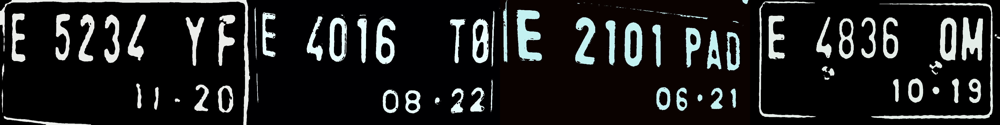

In [ ]:
result_img1 = kmeans(correction_img1)
result_img2 = kmeans(correction_img2)
result_img3 = kmeans(correction_img3)
result_img4 = kmeans(correction_img4)

final_frame = np.hstack((result_img1, result_img2, result_img3, result_img4))

cv2_imshow(final_frame)

# test3 = kmeans(test2)
# cv2_imshow(test3)